## Task 1: Data Exploration and Preprocessing

In [9]:
# Import the necessary libraries for data preprocessing and manipulation

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster

In [10]:
# Load the dataset

df = pd.read_csv(r"C:\Users\DELL\Downloads\Cognifyz Task 1\Dataset.csv")

In [11]:
# Print the top rows

df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [12]:
# Check the info on the dataset

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

###### The dataset has 9551 rows and 21 columns

In [13]:
# Check for null values

df.isnull().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

###### There are no missing datasets in the data

###### Mapping the binary data to boolean conversions

In [18]:
# Performing datatype conversions

df['Has Table Booking'] = df['Has Table booking'].map({'Yes': True, 'No': False})
df['Has Online Delivery'] = df['Has Online delivery'].map({'Yes': True, 'No': False})
df['Is Delivering Now'] = df['Is delivering now'].map({'Yes': True, 'No': False})
df['Switch to Order Menu'] = df['Switch to order menu'].map({'Yes': True, 'No': False})

###### To analyze the distribution of the target variable ("Aggregate rating") and identify any class imbalances.

In [19]:
df['Aggregate rating'].value_counts()

Aggregate rating
0.0    2148
3.2     522
3.1     519
3.4     498
3.3     483
3.5     480
3.0     468
3.6     458
3.7     427
3.8     400
2.9     381
3.9     335
2.8     315
4.1     274
4.0     266
2.7     250
4.2     221
2.6     191
4.3     174
4.4     144
2.5     110
4.5      95
2.4      87
4.6      78
4.9      61
2.3      47
4.7      42
2.2      27
4.8      25
2.1      15
2.0       7
1.9       2
1.8       1
Name: count, dtype: int64

###### From this result, the dataset looks imbalanced with a majority of the rating falling on the "0.0" with 2148 ratings and ("1.8, 1.9, 2.0") with 1, 2 and  ratings respectively, making up an unequal part of the data.

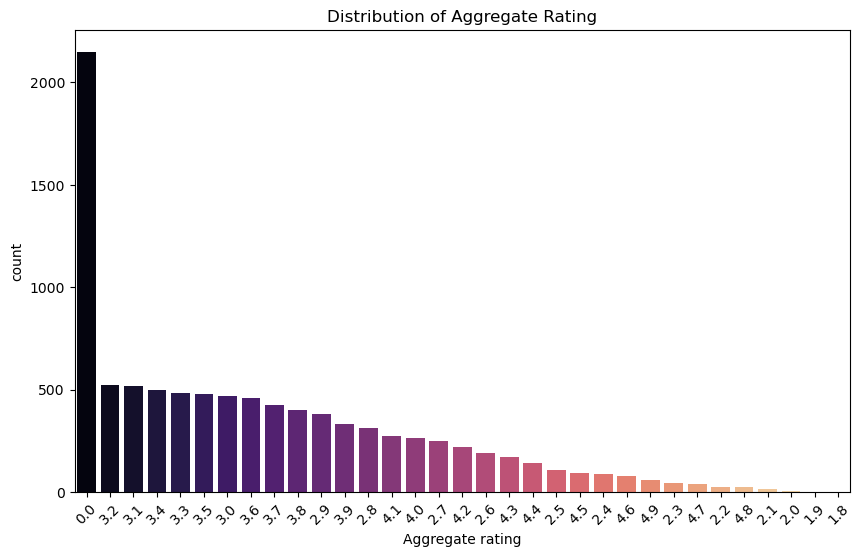

In [20]:
# Let's view it in a countplot

plt.figure(figsize=(10,6))
sns.countplot(data=df, x="Aggregate rating", order=df["Aggregate rating"].value_counts().index, palette="magma")
plt.title("Distribution of Aggregate Rating")
plt.xticks(rotation=45)
plt.show()

###### Calculating the distribution in percentages

In [21]:
df["Aggregate rating"].value_counts(normalize=True)*100

Aggregate rating
0.0    22.489792
3.2     5.465396
3.1     5.433986
3.4     5.214114
3.3     5.057062
3.5     5.025652
3.0     4.900010
3.6     4.795309
3.7     4.470736
3.8     4.188043
2.9     3.989111
3.9     3.507486
2.8     3.298084
4.1     2.868810
4.0     2.785049
2.7     2.617527
4.2     2.313894
2.6     1.999791
4.3     1.821799
4.4     1.507696
2.5     1.151712
4.5     0.994660
2.4     0.910899
4.6     0.816668
4.9     0.638677
2.3     0.492095
4.7     0.439745
2.2     0.282693
4.8     0.261753
2.1     0.157052
2.0     0.073291
1.9     0.020940
1.8     0.010470
Name: proportion, dtype: float64

## Task 2: Descriptive Analysis

In [22]:
# Calculating basic statistical measures

df.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


In [23]:
# Distribution of Categorical Variables

country_code_distribution = df["Country Code"].value_counts()

print(country_code_distribution)

Country Code
1      8652
216     434
215      80
30       60
214      60
189      60
148      40
208      34
14       24
162      22
94       21
184      20
166      20
191      20
37        4
Name: count, dtype: int64


In [24]:
city_distribution = df["City"].value_counts()

print(city_distribution)

City
New Delhi           5473
Gurgaon             1118
Noida               1080
Faridabad            251
Ghaziabad             25
                    ... 
Panchkula              1
Mc Millan              1
Mayfield               1
Macedon                1
Vineland Station       1
Name: count, Length: 141, dtype: int64


In [25]:
cuisines_distribution = df["Cuisines"].value_counts()

print(cuisines_distribution)

Cuisines
North Indian                                             936
North Indian, Chinese                                    511
Chinese                                                  354
Fast Food                                                354
North Indian, Mughlai                                    334
                                                        ... 
Bengali, Fast Food                                         1
North Indian, Rajasthani, Asian                            1
Chinese, Thai, Malaysian, Indonesian                       1
Bakery, Desserts, North Indian, Bengali, South Indian      1
Italian, World Cuisine                                     1
Name: count, Length: 1825, dtype: int64


In [26]:
# Top 10 Cuisines

top_10_cuisines = df["Cuisines"].value_counts().head(10)

print("Top 10", top_10_cuisines)

Top 10 Cuisines
North Indian                      936
North Indian, Chinese             511
Chinese                           354
Fast Food                         354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Street Food                       149
Name: count, dtype: int64


In [27]:
# Top 10 Cities with the highest number of restaurants

top_10_cities = df["City"].value_counts().head(10)

print("Top 10 Cities with The Highest Number of Restaurants:\n", top_10_cities)

Top 10 Cities with The Highest Number of Restaurants:
 City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Amritsar          21
Ahmedabad         21
Lucknow           21
Guwahati          21
Name: count, dtype: int64


## Task 3: Geospatial Analysis

In [28]:
# Calculating the mean of latitude and longitude

latitude_mean = df["Latitude"].mean()
longitude_mean = df["Longitude"].mean()

In [29]:
# Create map items

maps = folium.Map(location=[latitude_mean, longitude_mean], zoom_start=12)

In [30]:
# Create a marker cluster

marker_cluster = MarkerCluster().add_to(maps)

In [31]:
# Iterate over the dataset and add the markers to the map

for idx, row in df.iterrows():
    folium.Marker(location=[row["Latitude"], row["Longitude"]], popup=row["Restaurant Name"]).add_to(marker_cluster)

In [32]:
# Visualize the map

maps

In [33]:
# Save the map

maps.save("restaurants_map.html")

In [34]:
# Number of restaurants per city

restaurant_city_distribution = df['City'].value_counts()

# Number of restaurants per country

restaurant_country_distribution = df['Country Code'].value_counts()

In [35]:
# The Top 10 Cities

print("Top 10 Cities with the Highest Number of Restaurants:")
print(restaurant_city_distribution.head(10))

Top 10 Cities with the Highest Number of Restaurants:
City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Amritsar          21
Ahmedabad         21
Lucknow           21
Guwahati          21
Name: count, dtype: int64


In [36]:
# The Top 10 Countries

print("\nTop 10 Countries with the Highest Number of Restaurants:")
print(restaurant_country_distribution.head(10))


Top 10 Countries with the Highest Number of Restaurants:
Country Code
1      8652
216     434
215      80
30       60
214      60
189      60
148      40
208      34
14       24
162      22
Name: count, dtype: int64


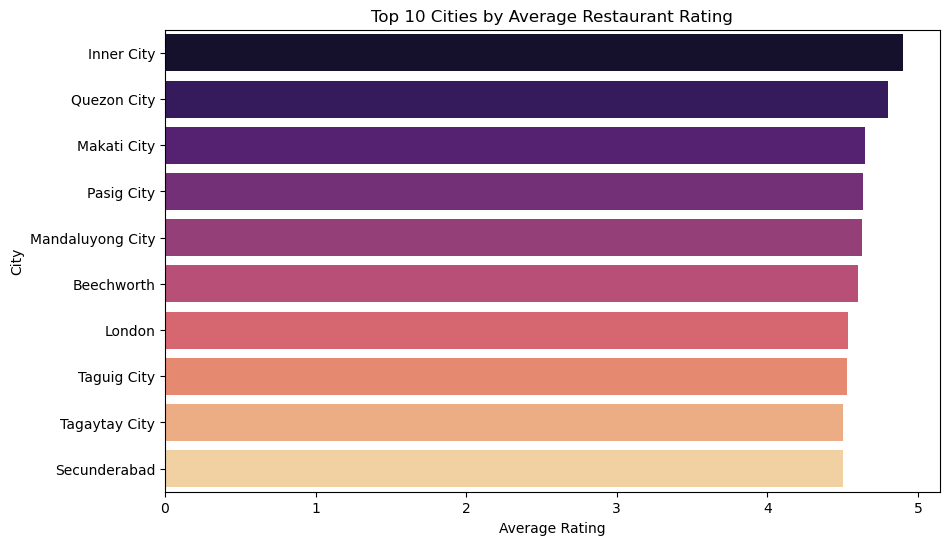

In [37]:
# Calculating the mean aggregate rating for each city

city_ratings = df.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False)

# The Top 10 cities by average rating

plt.figure(figsize=(10,6))
sns.barplot(x=city_ratings.head(10).values, y=city_ratings.head(10).index, palette='magma')
plt.title('Top 10 Cities by Average Restaurant Rating')
plt.xlabel('Average Rating')
plt.ylabel('City')
plt.show()

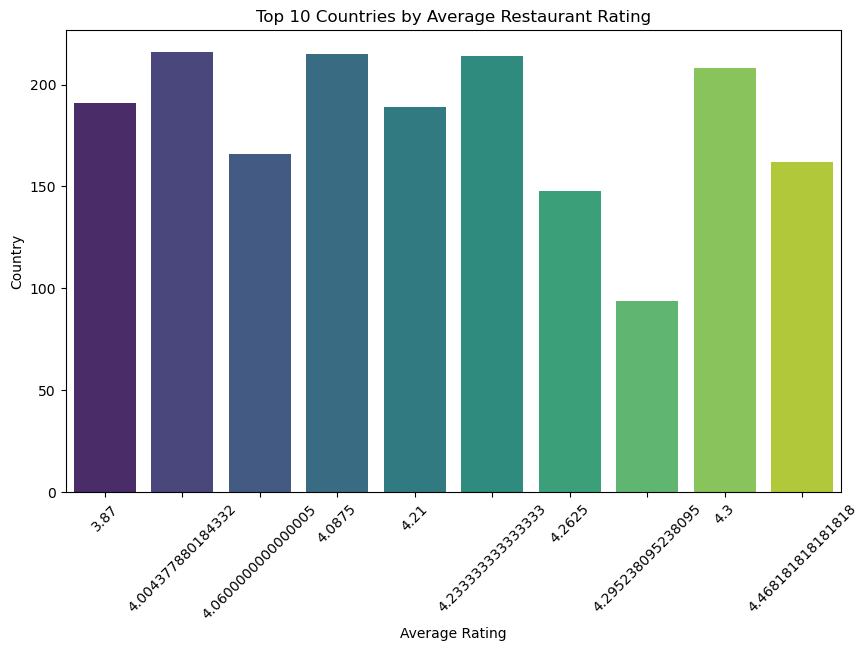

In [38]:
# Calculating the mean aggregate rating for each country

country_code_ratings = df.groupby('Country Code')['Aggregate rating'].mean().sort_values(ascending=False)

# The Top 10 countries by average rating

plt.figure(figsize=(10,6))
sns.barplot(x=country_code_ratings.head(10).values, y=country_code_ratings.head(10).index, palette='viridis')
plt.title('Top 10 Countries by Average Restaurant Rating')
plt.xlabel('Average Rating')
plt.ylabel('Country')
plt.xticks(rotation=45)
plt.show()

In [39]:
# Grouping by City and calculating the mean rating and the number of restaurants

grouped_city = df.groupby('City').agg({'Aggregate rating': 'mean', 'Restaurant ID': 'count'})
grouped_city.columns = ['Average Rating', 'Number of Restaurants']

In [40]:
grouped_city.head(15)

,Average Rating,Number of Restaurants
City,,
Abu Dhabi,4.300000,20
Agra,3.965000,20
Ahmedabad,4.161905,21
Albany,3.555000,20
Allahabad,3.395000,20
Amritsar,3.685714,21
Ankara,4.305000,20
Armidale,3.500000,1
Athens,4.200000,20


In [41]:
# Calculate the correlation between restaurants' location and average rating by city

correlation_city = grouped_city.corr().loc['Number of Restaurants', 'Average Rating']
print(f"Correlation between location of restaurants and its rating: {correlation_city}")

Correlation between location of restaurants and its rating: -0.3286275051029894


###### This shows that there's no correlation between the location and rating by city

In [42]:
# Grouping by Country Code and calculating the mean rating and the number of restaurants

country_grouped = df.groupby('Country Code').agg({'Aggregate rating': 'mean', 'Restaurant ID': 'count'})
country_grouped.columns = ['Average Rating', 'Number of Restaurants']

In [43]:
country_grouped.head(15)

,Average Rating,Number of Restaurants
Country Code,,
1,2.523324,8652
14,3.658333,24
30,3.763333,60
37,3.575000,4
94,4.295238,21
148,4.262500,40
162,4.468182,22
166,4.060000,20
184,3.575000,20


In [44]:
# Calculate the correlation between restaurants' location and average rating by country code

correlation_country = country_grouped.corr().loc['Number of Restaurants', 'Average Rating']
print(f"Correlation between location of restaurants and its rating: {correlation_country}")

Correlation between location of restaurants and its rating: -0.8065537094557725


###### There's no correlation between location and rating by country either